In [1]:
import torch.optim as optim
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import sys

In [2]:

root = '/home/j3zeng/ECE285/ECE285_final_proj/pytorch-CycleGAN-and-pix2pix/data'
sys.path.insert(1, root)
root = '/home/j3zeng/ECE285/ECE285_final_proj/'
sys.path.insert(1, root)
from syn500_dataset import *
from model.discriminator import * 
from model.generator import *
from model.GAN import *

In [3]:
batch_size = 4
# load dataset
train_dataset = SegmentLoader('../data/Synscapes500/',def_int='class_3channel')
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = SegmentLoader('../data/Synscapes100/',def_int='class_3channel')
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)


Loadding files from ../data/Synscapes500
Loaded:500
Loadding files from ../data/Synscapes100
Loaded:100


Text(0.5, 1.0, 'label image')

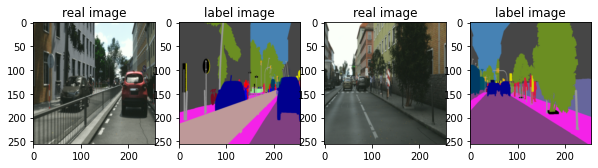

In [4]:
# show an example
fig = plt.figure(figsize=(10,3))
ax = fig.add_subplot(1,4,1)
plt.imshow(train_dataset.__getitem__(0)['B'].permute(1,2,0)/2+0.5)
plt.title('real image')
ax = fig.add_subplot(1,4,2)
plt.imshow(train_dataset.__getitem__(0)['A'].permute(1,2,0)/2+0.5)
plt.title('label image')
ax = fig.add_subplot(1,4,3)
plt.imshow(test_dataset.__getitem__(0)['B'].permute(1,2,0)/2+0.5)
plt.title('real image')
ax = fig.add_subplot(1,4,4)
plt.imshow(test_dataset.__getitem__(0)['A'].permute(1,2,0)/2+0.5)
plt.title('label image')

In [5]:
# default setting
lr = 1e-3
beta1 = 0.5
lambda_L1 = 100

In [9]:
# initialize
G_net = UNetGenerator(inputc = 3, outputc = 3)
# G_net = UnetGenerator(input_nc = 3, output_nc = 3, num_downs=8, use_dropout=True)

# D_net = Discriminator(inputc = 6)
D_net = Discriminator(inputc = 6)

criterionGAN = GANLoss1().cuda()
L1Loss = nn.L1Loss().cuda()
optimizer_G = optim.Adam(G_net.parameters(), lr=lr, betas = (beta1, 0.999))
optimizer_D = optim.Adam(D_net.parameters(), lr=lr, betas = (beta1, 0.999))

In [7]:
# initialize weight
def init_weight(m):
    if isinstance(m, nn.Conv2d):
        nn.init.normal_(m.weight, mean=0.0, std=0.02)
    else:
        pass
G_net.apply(init_weight)
D_net.apply(init_weight)

Discriminator(
  (conv1): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
  (bn4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  (relu): LeakyReLU(negative_slope=0.2, inplace=True)
)

In [10]:
# parallel
G_net = torch.nn.DataParallel(G_net, device_ids=range(len('0'))).cuda()
D_net = torch.nn.DataParallel(D_net, device_ids=range(len('0'))).cuda()
Gpath = './G_net_class50.pt'
Dpath = './D_netclass50.pt'
G_net.load_state_dict(torch.load(Gpath))
D_net.load_state_dict(torch.load(Dpath))

<All keys matched successfully>

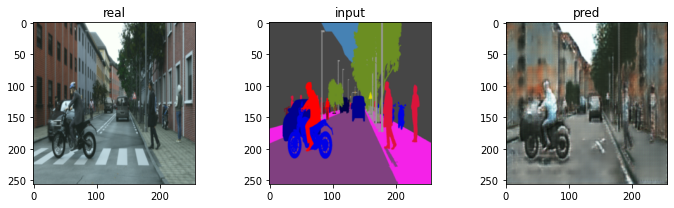

epoch: 0/0 -- loss_D: 0.24694019556045532, loss_G: 30.17122459411621
epoch: 0/50 -- loss_D: 0.24160681664943695, loss_G: 25.764469146728516
epoch: 0/100 -- loss_D: 0.4705636501312256, loss_G: 18.856565475463867


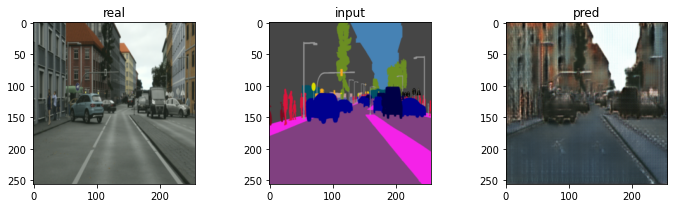

epoch: 1/0 -- loss_D: 0.29341626167297363, loss_G: 22.081470489501953
epoch: 1/50 -- loss_D: 0.33605462312698364, loss_G: 25.162765502929688
epoch: 1/100 -- loss_D: 0.5332387685775757, loss_G: 21.701622009277344


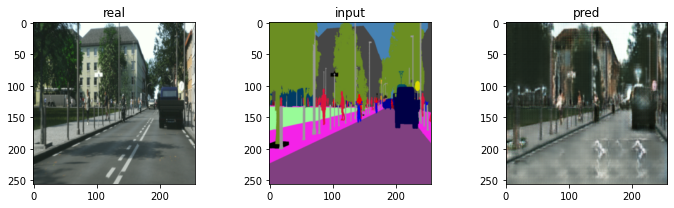

epoch: 2/0 -- loss_D: 0.4624212384223938, loss_G: 25.376100540161133
epoch: 2/50 -- loss_D: 1.0117533206939697, loss_G: 22.523731231689453
epoch: 2/100 -- loss_D: 0.371152400970459, loss_G: 25.15474510192871


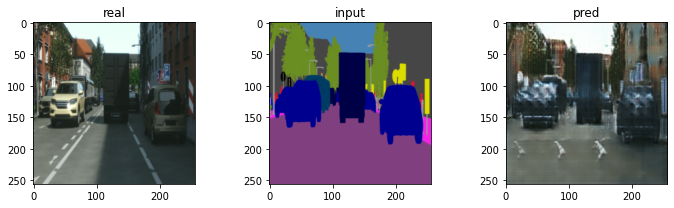

epoch: 3/0 -- loss_D: 0.4296884834766388, loss_G: 24.48204803466797
epoch: 3/50 -- loss_D: 0.21545690298080444, loss_G: 28.31885528564453
epoch: 3/100 -- loss_D: 0.551677405834198, loss_G: 30.830928802490234


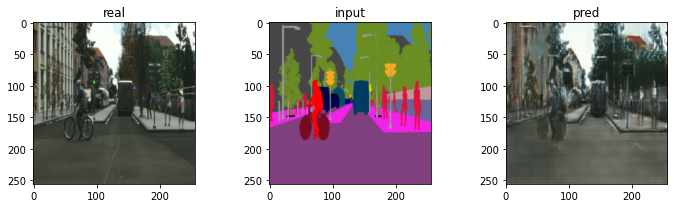

epoch: 4/0 -- loss_D: 0.4802274703979492, loss_G: 22.552160263061523
epoch: 4/50 -- loss_D: 0.32196784019470215, loss_G: 22.38470458984375
epoch: 4/100 -- loss_D: 0.3400675356388092, loss_G: 24.45470428466797


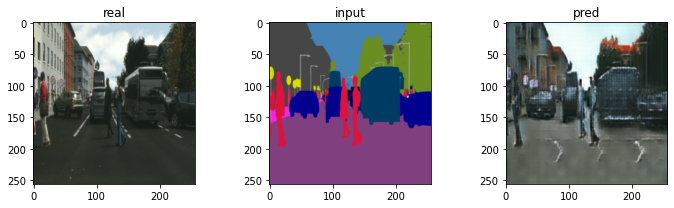

epoch: 5/0 -- loss_D: 0.49385273456573486, loss_G: 22.09891700744629
epoch: 5/50 -- loss_D: 0.3231014013290405, loss_G: 23.803943634033203
epoch: 5/100 -- loss_D: 0.3373573124408722, loss_G: 22.229223251342773


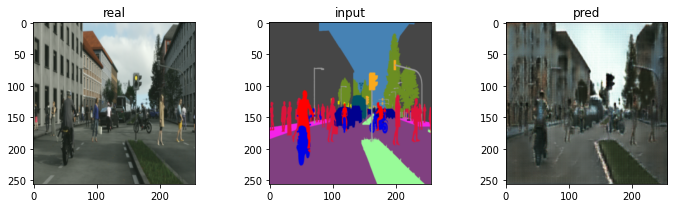

epoch: 6/0 -- loss_D: 0.5215743184089661, loss_G: 19.444442749023438
epoch: 6/50 -- loss_D: 0.7298758029937744, loss_G: 20.24622344970703
epoch: 6/100 -- loss_D: 0.3898885250091553, loss_G: 22.414836883544922


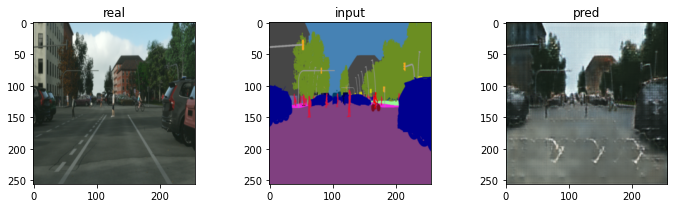

epoch: 7/0 -- loss_D: 0.4213563799858093, loss_G: 23.130462646484375
epoch: 7/50 -- loss_D: 0.1428486704826355, loss_G: 25.602750778198242
epoch: 7/100 -- loss_D: 0.29865893721580505, loss_G: 23.77928352355957


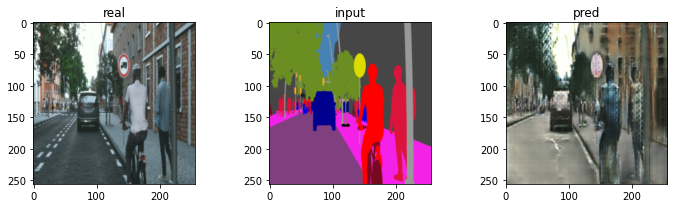

epoch: 8/0 -- loss_D: 0.6801564693450928, loss_G: 24.269268035888672
epoch: 8/50 -- loss_D: 0.8620790243148804, loss_G: 25.143402099609375
epoch: 8/100 -- loss_D: 0.4302775263786316, loss_G: 23.116636276245117


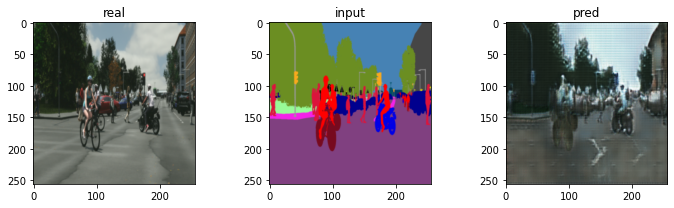

epoch: 9/0 -- loss_D: 0.7147667407989502, loss_G: 22.47923469543457
epoch: 9/50 -- loss_D: 0.4337546229362488, loss_G: 21.69579315185547
epoch: 9/100 -- loss_D: 0.27086853981018066, loss_G: 26.236679077148438


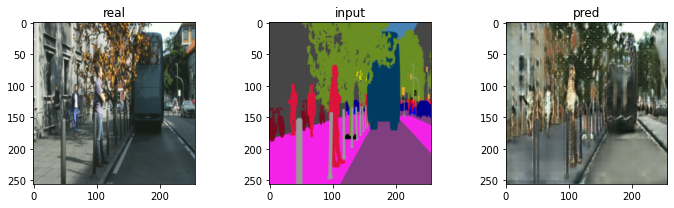

epoch: 10/0 -- loss_D: 0.3834356665611267, loss_G: 23.48060417175293
epoch: 10/50 -- loss_D: 0.5034052133560181, loss_G: 20.72698402404785
epoch: 10/100 -- loss_D: 0.36743301153182983, loss_G: 22.776838302612305


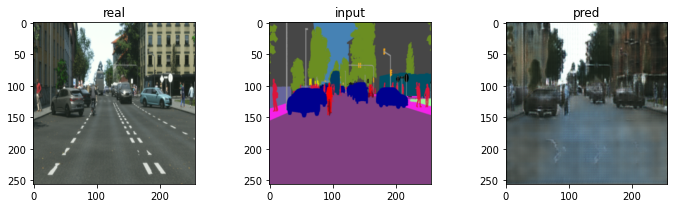

epoch: 11/0 -- loss_D: 0.4244774281978607, loss_G: 19.6363525390625
epoch: 11/50 -- loss_D: 0.4806444048881531, loss_G: 28.45277214050293
epoch: 11/100 -- loss_D: 0.5539125204086304, loss_G: 25.745365142822266


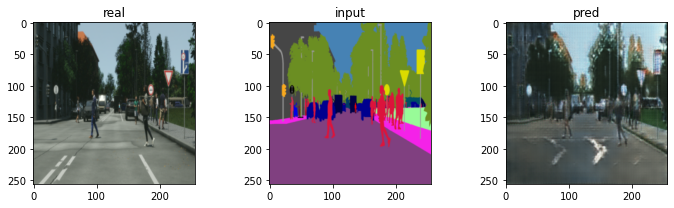

epoch: 12/0 -- loss_D: 1.2167831659317017, loss_G: 30.191566467285156
epoch: 12/50 -- loss_D: 0.3939209282398224, loss_G: 22.59303855895996
epoch: 12/100 -- loss_D: 0.22985267639160156, loss_G: 23.225067138671875


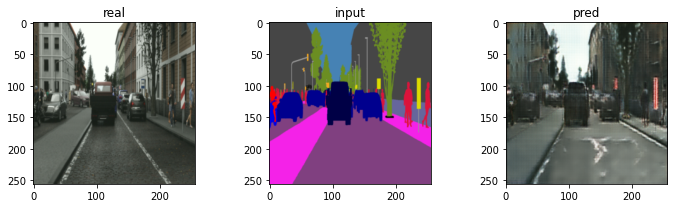

epoch: 13/0 -- loss_D: 0.5442503690719604, loss_G: 26.11211395263672
epoch: 13/50 -- loss_D: 0.3015841245651245, loss_G: 24.65598487854004
epoch: 13/100 -- loss_D: 0.5872426629066467, loss_G: 25.1717586517334


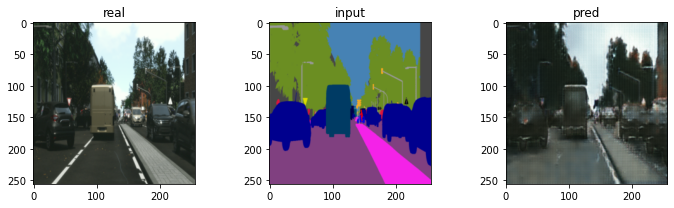

epoch: 14/0 -- loss_D: 0.20590642094612122, loss_G: 28.414928436279297
epoch: 14/50 -- loss_D: 0.49336928129196167, loss_G: 17.794330596923828
epoch: 14/100 -- loss_D: 0.6588909029960632, loss_G: 23.200515747070312


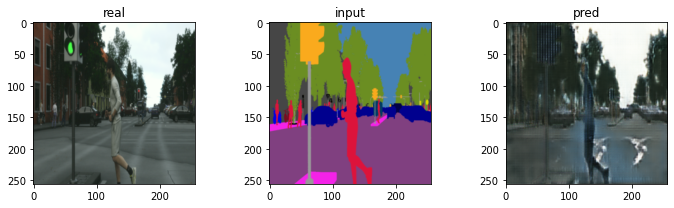

epoch: 15/0 -- loss_D: 0.5062180757522583, loss_G: 23.23675537109375
epoch: 15/50 -- loss_D: 0.5557346343994141, loss_G: 22.45102310180664
epoch: 15/100 -- loss_D: 0.24154534935951233, loss_G: 23.0670223236084


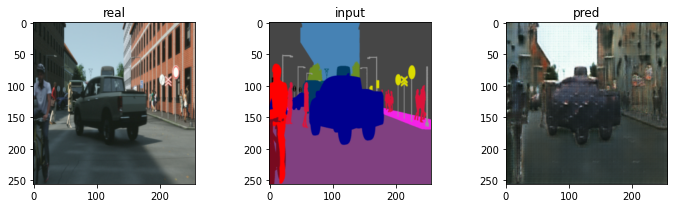

epoch: 16/0 -- loss_D: 0.5045974850654602, loss_G: 20.587060928344727
epoch: 16/50 -- loss_D: 0.47428178787231445, loss_G: 21.78937530517578
epoch: 16/100 -- loss_D: 0.333015501499176, loss_G: 22.80768394470215


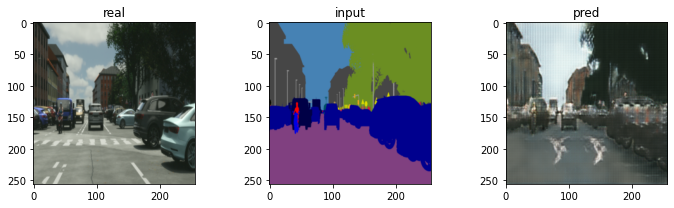

epoch: 17/0 -- loss_D: 0.2860645651817322, loss_G: 23.876035690307617
epoch: 17/50 -- loss_D: 0.22009404003620148, loss_G: 28.831239700317383
epoch: 17/100 -- loss_D: 0.31498363614082336, loss_G: 20.508899688720703


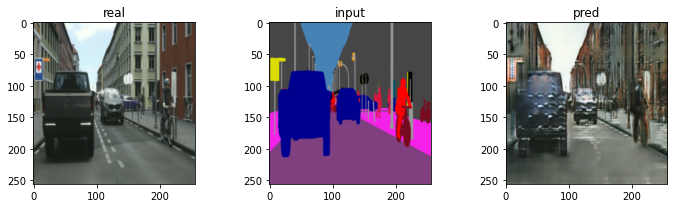

epoch: 18/0 -- loss_D: 0.6025667190551758, loss_G: 26.439496994018555
epoch: 18/50 -- loss_D: 0.5163015127182007, loss_G: 22.35561180114746
epoch: 18/100 -- loss_D: 0.9602969288825989, loss_G: 20.749984741210938


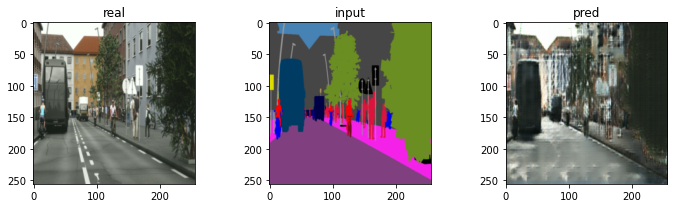

epoch: 19/0 -- loss_D: 0.3334910273551941, loss_G: 24.90609359741211
epoch: 19/50 -- loss_D: 0.778355598449707, loss_G: 21.48044776916504
epoch: 19/100 -- loss_D: 0.5469511151313782, loss_G: 21.472320556640625


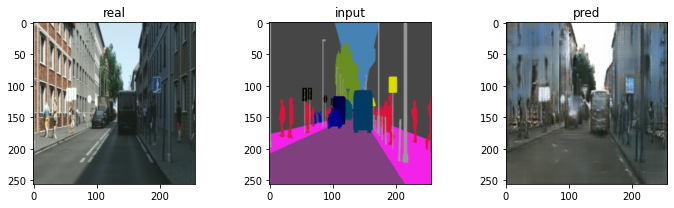

epoch: 20/0 -- loss_D: 0.6241464614868164, loss_G: 20.650928497314453
epoch: 20/50 -- loss_D: 0.40518704056739807, loss_G: 25.683443069458008
epoch: 20/100 -- loss_D: 0.4601697623729706, loss_G: 23.78097152709961


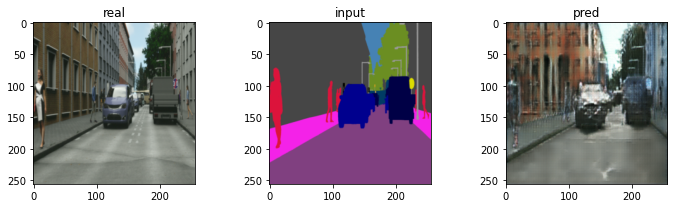

epoch: 21/0 -- loss_D: 0.6994761824607849, loss_G: 20.70649528503418
epoch: 21/50 -- loss_D: 0.26159995794296265, loss_G: 23.163898468017578
epoch: 21/100 -- loss_D: 0.6575409173965454, loss_G: 25.769184112548828


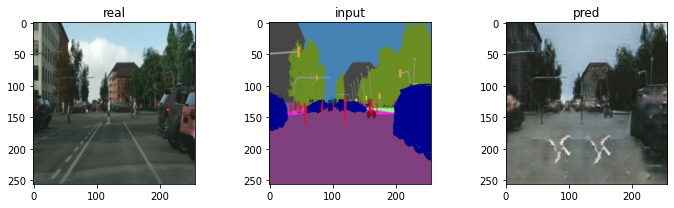

epoch: 22/0 -- loss_D: 0.09237212687730789, loss_G: 36.292236328125
epoch: 22/50 -- loss_D: 0.2966957986354828, loss_G: 22.564464569091797
epoch: 22/100 -- loss_D: 0.2615509629249573, loss_G: 25.433189392089844


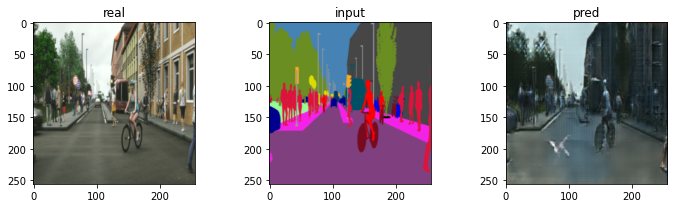

epoch: 23/0 -- loss_D: 0.2980957329273224, loss_G: 25.604490280151367
epoch: 23/50 -- loss_D: 0.7821108102798462, loss_G: 22.067041397094727
epoch: 23/100 -- loss_D: 0.8166325688362122, loss_G: 23.73939323425293


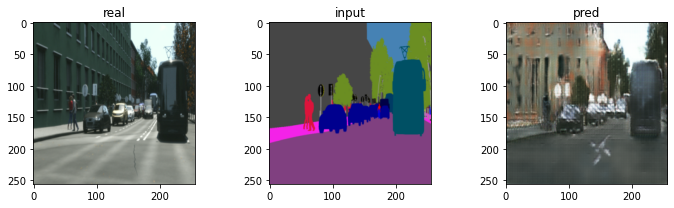

epoch: 24/0 -- loss_D: 0.23961591720581055, loss_G: 25.155927658081055
epoch: 24/50 -- loss_D: 0.32441502809524536, loss_G: 25.44510841369629
epoch: 24/100 -- loss_D: 0.368277907371521, loss_G: 22.556001663208008


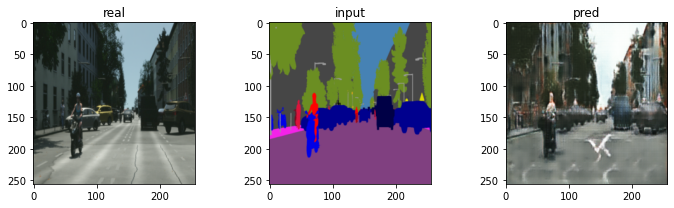

epoch: 25/0 -- loss_D: 0.6769120693206787, loss_G: 24.333070755004883
epoch: 25/50 -- loss_D: 0.5436348915100098, loss_G: 22.481008529663086
epoch: 25/100 -- loss_D: 0.6119807958602905, loss_G: 19.85210418701172


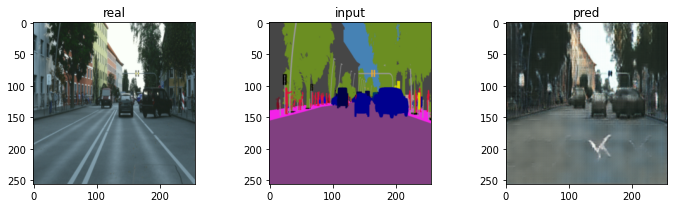

epoch: 26/0 -- loss_D: 0.28080427646636963, loss_G: 21.82146453857422
epoch: 26/50 -- loss_D: 0.3483858108520508, loss_G: 27.34682846069336
epoch: 26/100 -- loss_D: 0.34631797671318054, loss_G: 23.88896369934082


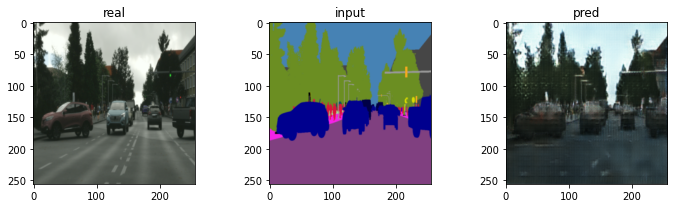

epoch: 27/0 -- loss_D: 0.5882738828659058, loss_G: 22.832895278930664
epoch: 27/50 -- loss_D: 0.3344203233718872, loss_G: 21.46950340270996
epoch: 27/100 -- loss_D: 0.18769429624080658, loss_G: 25.414039611816406


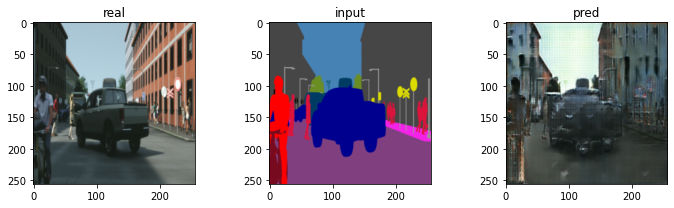

epoch: 28/0 -- loss_D: 0.23081225156784058, loss_G: 29.381013870239258
epoch: 28/50 -- loss_D: 0.39935803413391113, loss_G: 20.747549057006836
epoch: 28/100 -- loss_D: 0.13915163278579712, loss_G: 24.97286605834961


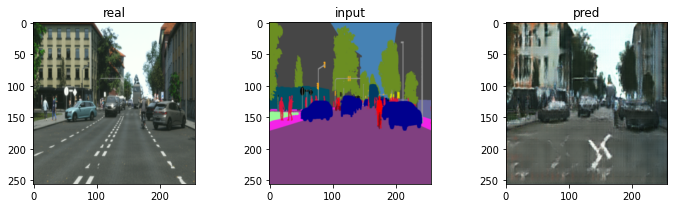

epoch: 29/0 -- loss_D: 0.38413920998573303, loss_G: 30.014755249023438
epoch: 29/50 -- loss_D: 0.45365893840789795, loss_G: 22.193397521972656
epoch: 29/100 -- loss_D: 0.24766497313976288, loss_G: 26.039321899414062


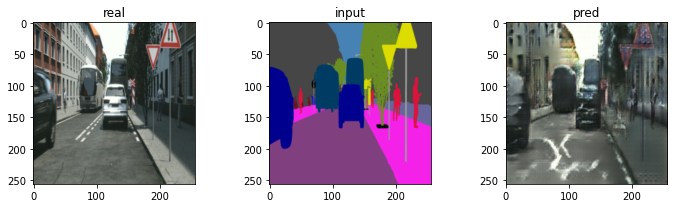

epoch: 30/0 -- loss_D: 0.46785974502563477, loss_G: 21.704294204711914
epoch: 30/50 -- loss_D: 0.7267395853996277, loss_G: 18.985713958740234
epoch: 30/100 -- loss_D: 0.3902391791343689, loss_G: 24.14194679260254


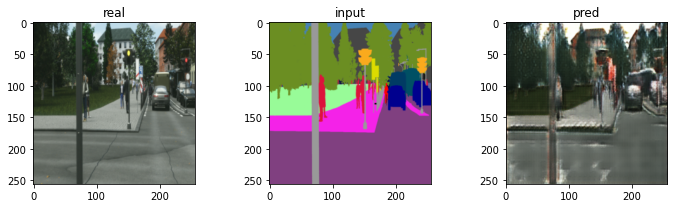

epoch: 31/0 -- loss_D: 0.5495010614395142, loss_G: 22.59992218017578
epoch: 31/50 -- loss_D: 0.3579886853694916, loss_G: 22.738502502441406
epoch: 31/100 -- loss_D: 0.24089786410331726, loss_G: 22.65536117553711


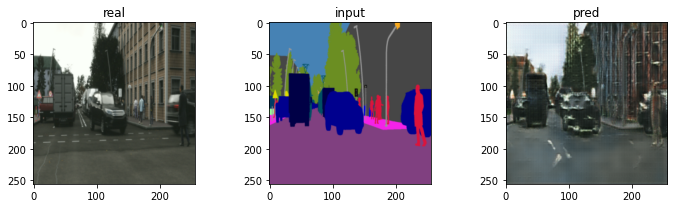

epoch: 32/0 -- loss_D: 0.7153012752532959, loss_G: 18.325119018554688
epoch: 32/50 -- loss_D: 0.5320450067520142, loss_G: 20.52558135986328
epoch: 32/100 -- loss_D: 0.5984747409820557, loss_G: 23.730112075805664


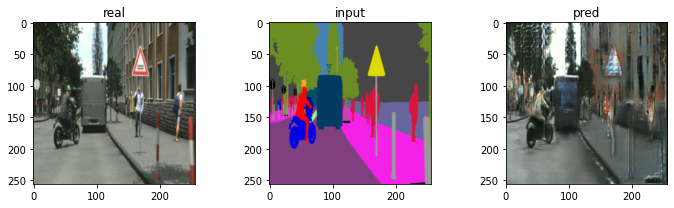

epoch: 33/0 -- loss_D: 0.3932333290576935, loss_G: 23.907817840576172
epoch: 33/50 -- loss_D: 0.45350635051727295, loss_G: 23.671926498413086
epoch: 33/100 -- loss_D: 0.31781378388404846, loss_G: 26.183353424072266


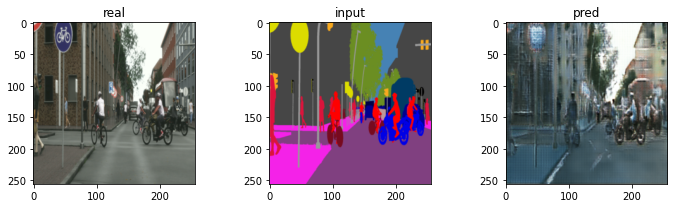

epoch: 34/0 -- loss_D: 0.705685555934906, loss_G: 22.603050231933594
epoch: 34/50 -- loss_D: 0.7776810526847839, loss_G: 20.675512313842773
epoch: 34/100 -- loss_D: 0.4141998291015625, loss_G: 24.658437728881836


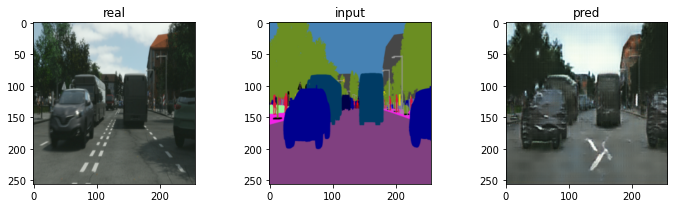

epoch: 35/0 -- loss_D: 0.48283010721206665, loss_G: 19.52593421936035
epoch: 35/50 -- loss_D: 0.28363901376724243, loss_G: 23.52706527709961
epoch: 35/100 -- loss_D: 0.46893465518951416, loss_G: 21.502822875976562


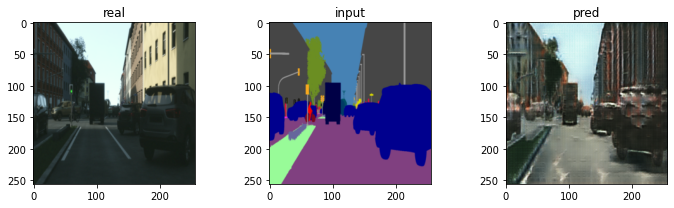

epoch: 36/0 -- loss_D: 0.4866248369216919, loss_G: 25.55982208251953
epoch: 36/50 -- loss_D: 0.3160596489906311, loss_G: 23.150270462036133
epoch: 36/100 -- loss_D: 0.3632039725780487, loss_G: 23.71480941772461


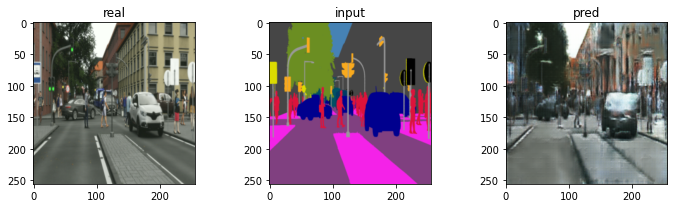

epoch: 37/0 -- loss_D: 0.3440382480621338, loss_G: 23.367996215820312
epoch: 37/50 -- loss_D: 0.361505389213562, loss_G: 16.014978408813477
epoch: 37/100 -- loss_D: 0.3109237849712372, loss_G: 21.63823699951172


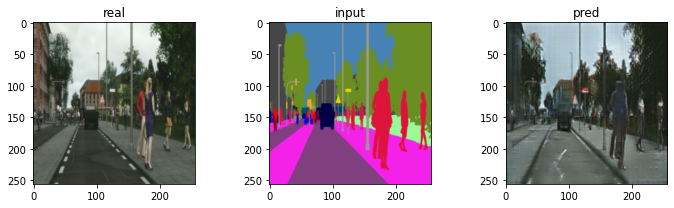

epoch: 38/0 -- loss_D: 0.6210763454437256, loss_G: 20.103242874145508
epoch: 38/50 -- loss_D: 0.8031498193740845, loss_G: 27.143299102783203
epoch: 38/100 -- loss_D: 0.3852475881576538, loss_G: 21.68967056274414


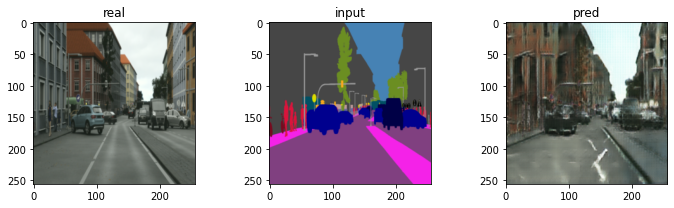

epoch: 39/0 -- loss_D: 0.2546858489513397, loss_G: 24.797203063964844
epoch: 39/50 -- loss_D: 0.21690663695335388, loss_G: 22.67057228088379
epoch: 39/100 -- loss_D: 0.8436971306800842, loss_G: 19.903221130371094


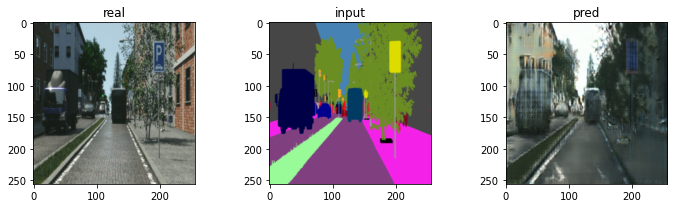

epoch: 40/0 -- loss_D: 0.4540926516056061, loss_G: 23.18667221069336
epoch: 40/50 -- loss_D: 0.47365516424179077, loss_G: 22.116689682006836
epoch: 40/100 -- loss_D: 0.4359985589981079, loss_G: 24.785263061523438


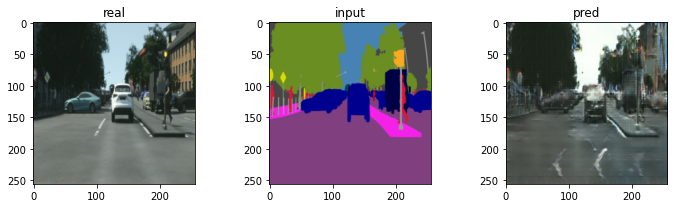

epoch: 41/0 -- loss_D: 0.7081164121627808, loss_G: 20.60882568359375
epoch: 41/50 -- loss_D: 0.35078752040863037, loss_G: 23.619510650634766
epoch: 41/100 -- loss_D: 0.3703216314315796, loss_G: 25.098102569580078


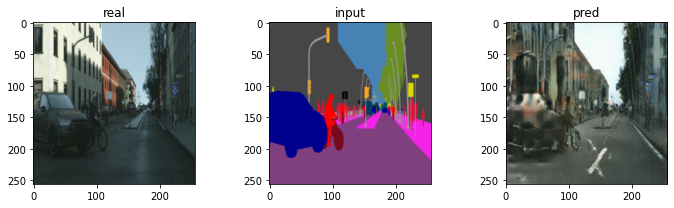

epoch: 42/0 -- loss_D: 0.23400193452835083, loss_G: 23.861900329589844
epoch: 42/50 -- loss_D: 0.12203861027956009, loss_G: 22.887100219726562
epoch: 42/100 -- loss_D: 0.8407431244850159, loss_G: 19.4278621673584


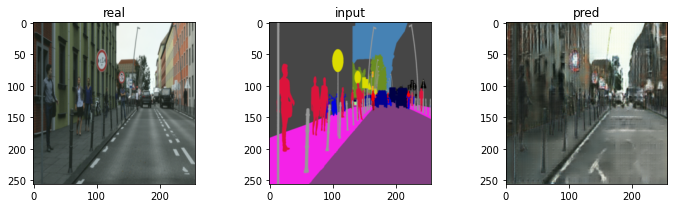

epoch: 43/0 -- loss_D: 0.25437599420547485, loss_G: 24.089717864990234
epoch: 43/50 -- loss_D: 0.7081610560417175, loss_G: 23.117870330810547
epoch: 43/100 -- loss_D: 0.8668029308319092, loss_G: 26.278898239135742


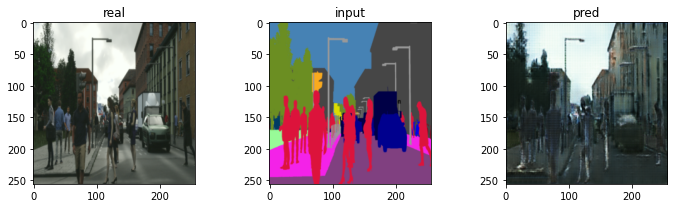

epoch: 44/0 -- loss_D: 0.5847076773643494, loss_G: 22.519954681396484
epoch: 44/50 -- loss_D: 0.6293337941169739, loss_G: 20.17167854309082
epoch: 44/100 -- loss_D: 0.6835966110229492, loss_G: 22.895259857177734


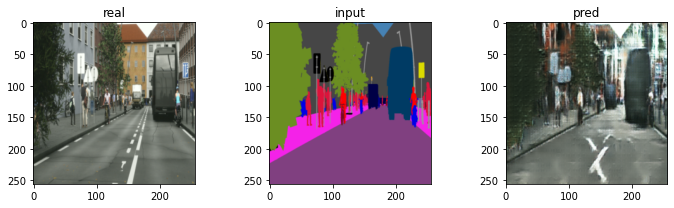

epoch: 45/0 -- loss_D: 0.990095853805542, loss_G: 22.747913360595703
epoch: 45/50 -- loss_D: 0.4823850691318512, loss_G: 22.005653381347656
epoch: 45/100 -- loss_D: 0.31311550736427307, loss_G: 25.469728469848633


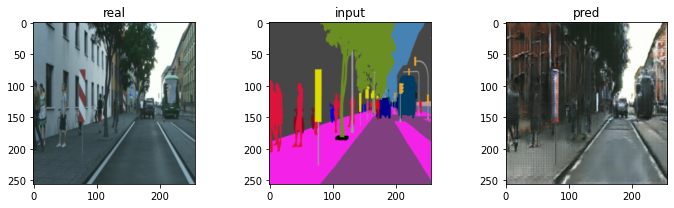

epoch: 46/0 -- loss_D: 0.4154449701309204, loss_G: 21.459733963012695
epoch: 46/50 -- loss_D: 0.1977793276309967, loss_G: 24.16522979736328
epoch: 46/100 -- loss_D: 0.8696909546852112, loss_G: 23.463918685913086


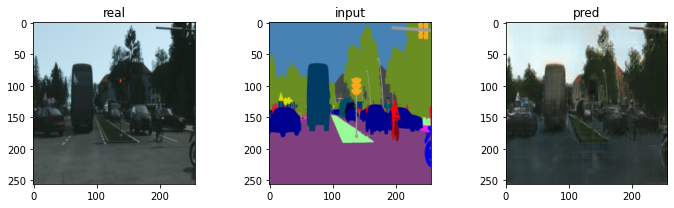

epoch: 47/0 -- loss_D: 0.46835440397262573, loss_G: 20.081274032592773
epoch: 47/50 -- loss_D: 0.6375925540924072, loss_G: 20.76080322265625
epoch: 47/100 -- loss_D: 0.4769986867904663, loss_G: 24.548795700073242


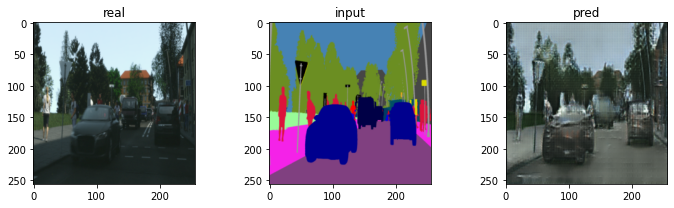

epoch: 48/0 -- loss_D: 0.5145882964134216, loss_G: 19.758331298828125
epoch: 48/50 -- loss_D: 0.2035008668899536, loss_G: 25.821866989135742
epoch: 48/100 -- loss_D: 0.7403312921524048, loss_G: 24.09572410583496


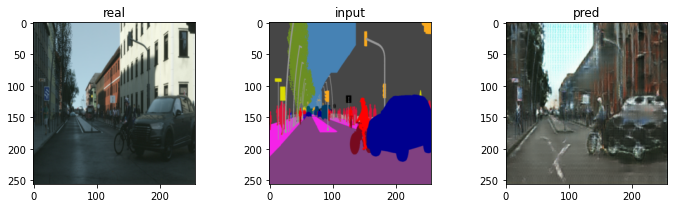

epoch: 49/0 -- loss_D: 0.9878816604614258, loss_G: 22.578367233276367
epoch: 49/50 -- loss_D: 0.7354784607887268, loss_G: 25.754688262939453
epoch: 49/100 -- loss_D: 0.605035662651062, loss_G: 23.739992141723633


In [11]:
for epoch in range(50):
    # visualize
    test_sample = next(iter(test_loader))
    test_out, test_in = test_sample['B'], test_sample['A']
    test_in = test_in.cuda()
    test_pred = G_net(test_in)
    fig = plt.figure(figsize=(10,3))
    ax = fig.add_subplot(1,3,1)
    plt.imshow(test_out[0,:,:,:].permute(1,2,0)/2+0.5)
    plt.title('real')
    ax = fig.add_subplot(1,3,2)
    plt.imshow(test_in[0,:,:,:].cpu().permute(1,2,0)/2+0.5)
    plt.title('input')
    ax = fig.add_subplot(1,3,3)
    plt.imshow(test_pred[0,:,:,:].cpu().detach().numpy().transpose(1,2,0)/2+0.5)
    plt.title('pred')
    fig.tight_layout()
    plt.show()
    
    
    for i, real_sample in enumerate(train_loader):
        real_output = real_sample['B']
        real_input = real_sample['A']
        real_output = real_output.cuda()
        real_input = real_input.cuda()
        # forward Generator
        fake_out = G_net(real_input)
        
        # enable backprop for Discriminator
        for param in D_net.parameters():
            param.requires_grad = True
#         for param in G_net.parameters():
#             param.requires_grad = False
        # set D's gradients to zero
        optimizer_D.zero_grad()
        fake_input = torch.cat((real_input, fake_out), 1)
        pred_fake = D_net(fake_input.detach())
        loss_fake = criterionGAN(pred_fake, real=False)
        
        pred_real = D_net(torch.cat((real_input, real_output),1))
        loss_real = criterionGAN(pred_real, real=True)
        loss_D = 1/2*(loss_fake + loss_real)
        loss_D.backward()
        optimizer_D.step()
        
        for param in D_net.parameters():
            param.requires_grad = False
#         for param in G_net.parameters():
#             param.requires_grad = True
#         fake_out = G_net(real_input)
        optimizer_G.zero_grad()
        fake_input1 = torch.cat((real_input, fake_out),1)
        pred_fake1 = D_net(fake_input1)
        loss_fake1 = criterionGAN(pred_fake1, real=True)
        loss_L1 = L1Loss(fake_out, real_output) * lambda_L1
        loss_G = loss_fake1 + loss_L1
        loss_G.backward()
        optimizer_G.step()
        if i % 50 == 0:
            print(f'epoch: {epoch}/{i} -- loss_D: {loss_D}, loss_G: {loss_G}')


In [13]:
import os 

In [14]:

Gpath = './G_net_class100.pt'
Dpath = './D_netclass100.pt'
torch.save(G_net.state_dict(), Gpath)
torch.save(D_net.state_dict(), Dpath)

0


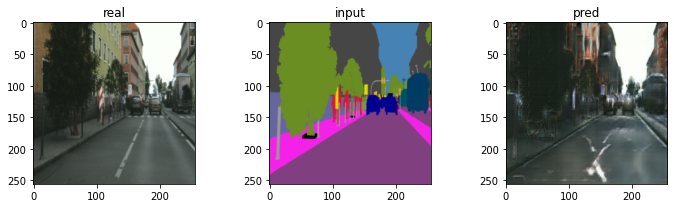

1


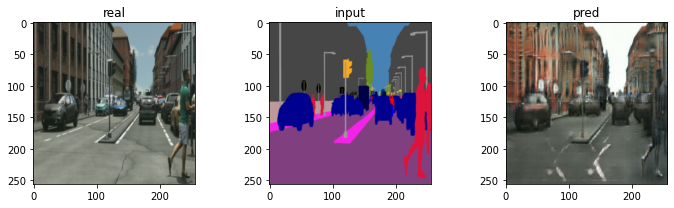

2


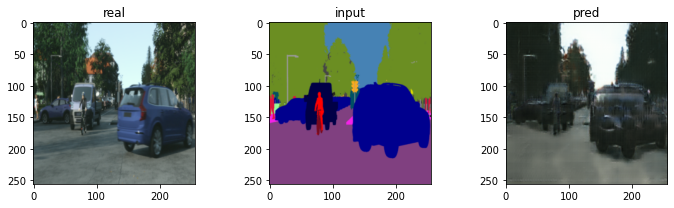

3


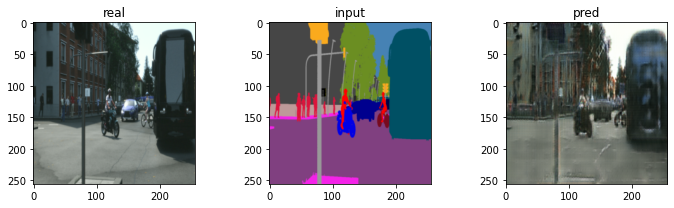

4


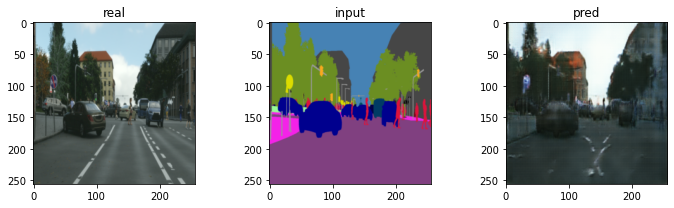

5


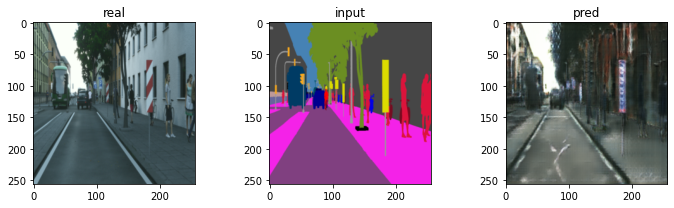

6


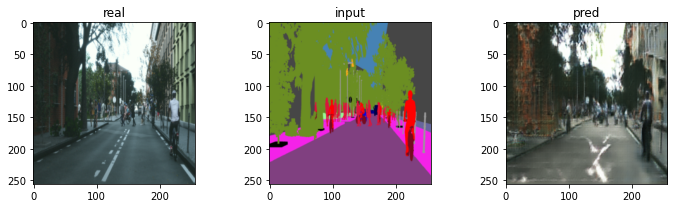

7


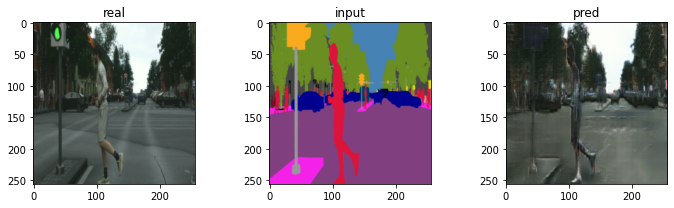

8


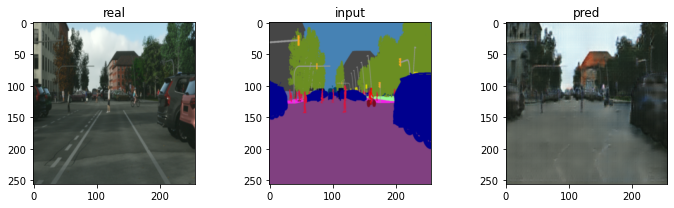

9


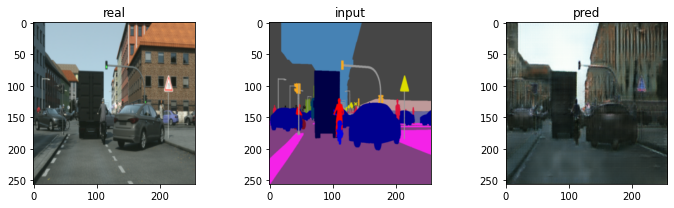

10


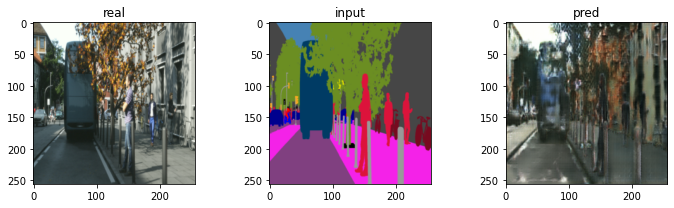

11


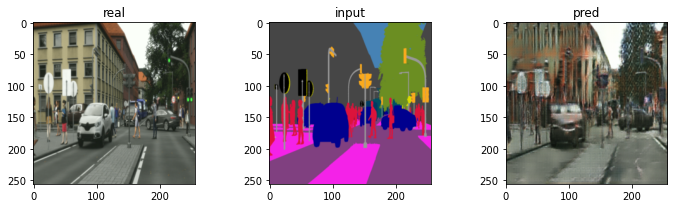

12


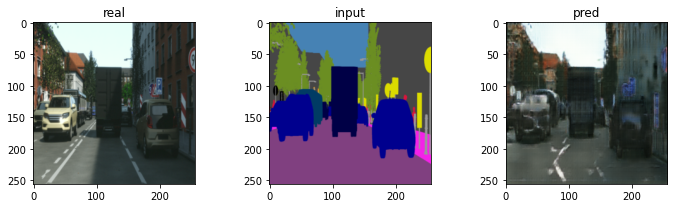

13


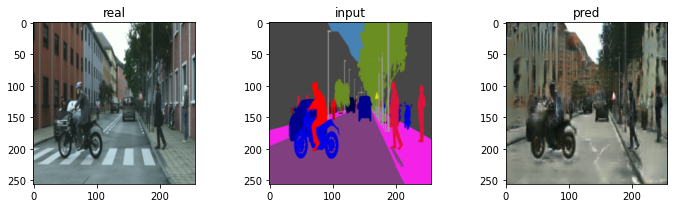

14


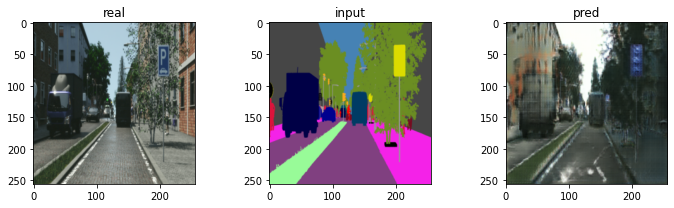

15


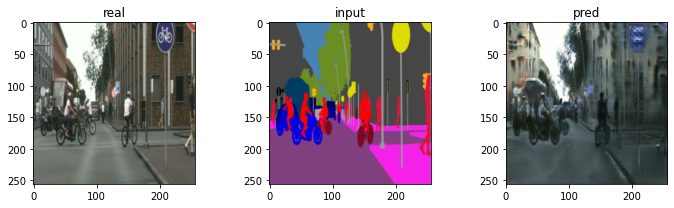

16


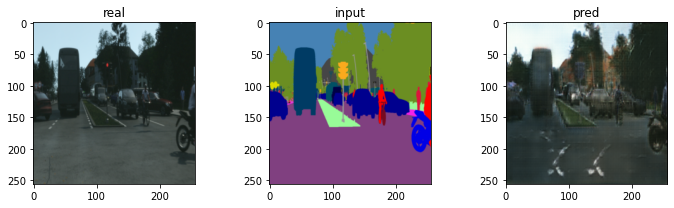

17


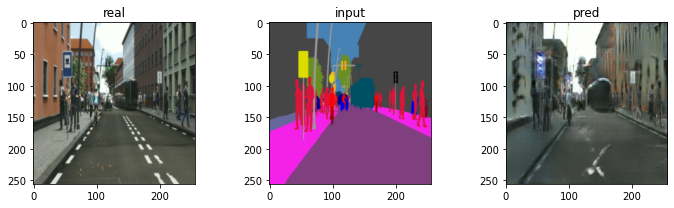

18


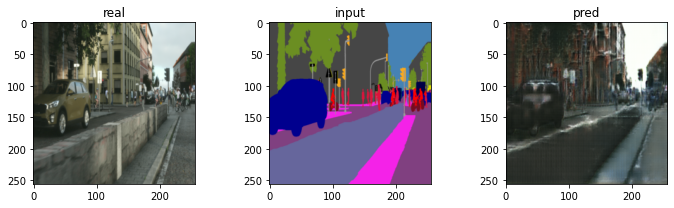

19


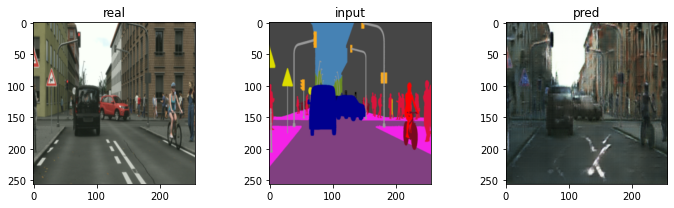

In [15]:
vis_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
iter_load = iter(vis_loader)
for i in range(20):
    print(i)
    test_sample = next(iter_load)
    test_out, test_in = test_sample['B'], test_sample['A']
    test_in = test_in.cuda()
    test_pred = G_net(test_in)
    fig = plt.figure(figsize=(10,3))
    ax = fig.add_subplot(1,3,1)
    plt.imshow(test_out[0,:,:,:].permute(1,2,0)/2+0.5)
    plt.title('real')
    ax = fig.add_subplot(1,3,2)
    plt.imshow(test_in[0,:,:,:].cpu().permute(1,2,0)/2+0.5)
    plt.title('input')
    ax = fig.add_subplot(1,3,3)
    plt.imshow(test_pred[0,:,:,:].cpu().detach().numpy().transpose(1,2,0)/2+0.5)
    plt.title('pred')
    fig.tight_layout()
    plt.show()